In [2]:
from pytorch_lightning import Trainer, seed_everything
from feature_analysis.models import LeNetPLModel
from feature_analysis.data import MNISTDataModule
from feature_analysis.app import MTrainer
from feature_analysis.analyser import Extractor, TSNEExplorer, UMapExplorer, CaptumExplainer

import numpy as np

seed_everything(42, workers=True)

Global seed set to 42


42

In [3]:
datamodule = MNISTDataModule()
datamodule.setup()
model = LeNetPLModel()

## Visualise raw MNIST data

In [4]:
extractor = Extractor(model, datamodule)
r_features_set, r_labels_set, image_data_set, (new_shape, total_item) = extractor.raw_data_batch()

In [5]:
X = np.asarray([r_features_set[..., i].ravel() for i in range(r_features_set.shape[-1])])

In [6]:
X.shape, r_features_set.shape, r_labels_set.shape

((4864, 784), (1, 28, 28, 4864), (4864,))

In [7]:
# TSNE

/Users/suneeta.mall/opt/miniconda3/envs/feature_analysis/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.


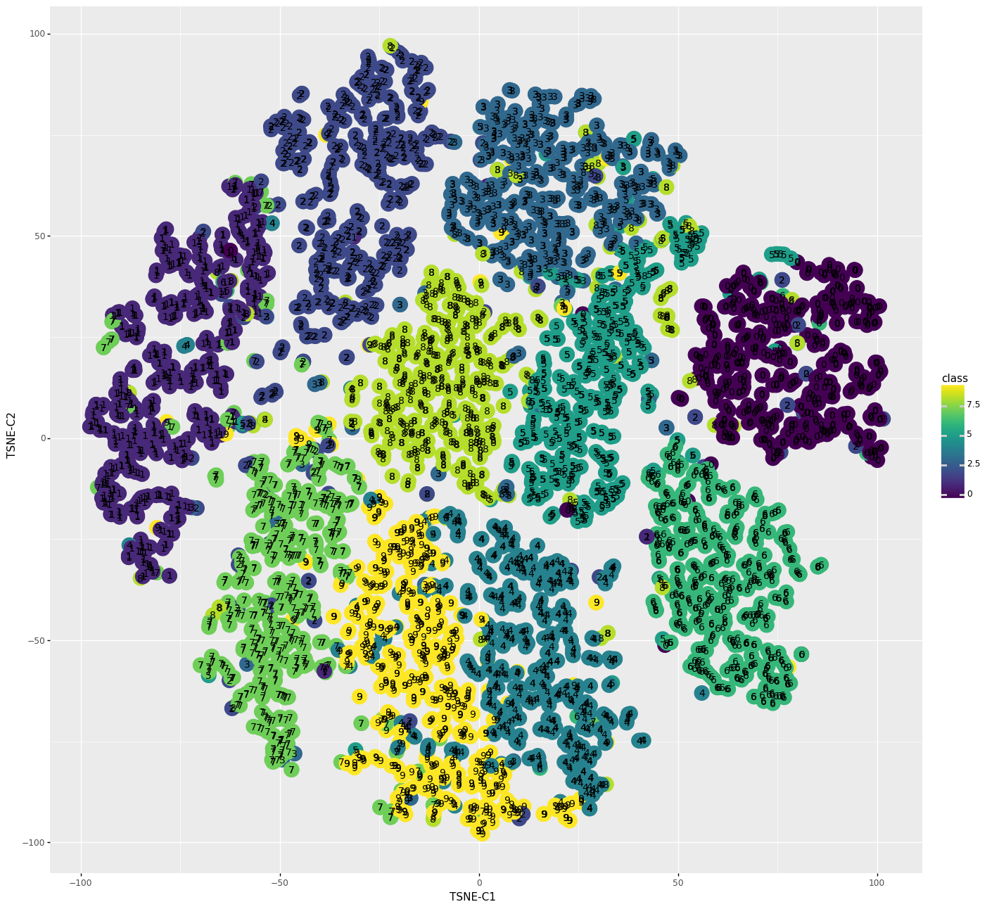

<ggplot: (8767884300737)>

In [8]:
%matplotlib inline

tsne = TSNEExplorer()
df = tsne.feature_map_batch(X, r_labels_set)
tsne.plot_gg(df)

/Users/suneeta.mall/opt/miniconda3/envs/feature_analysis/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.


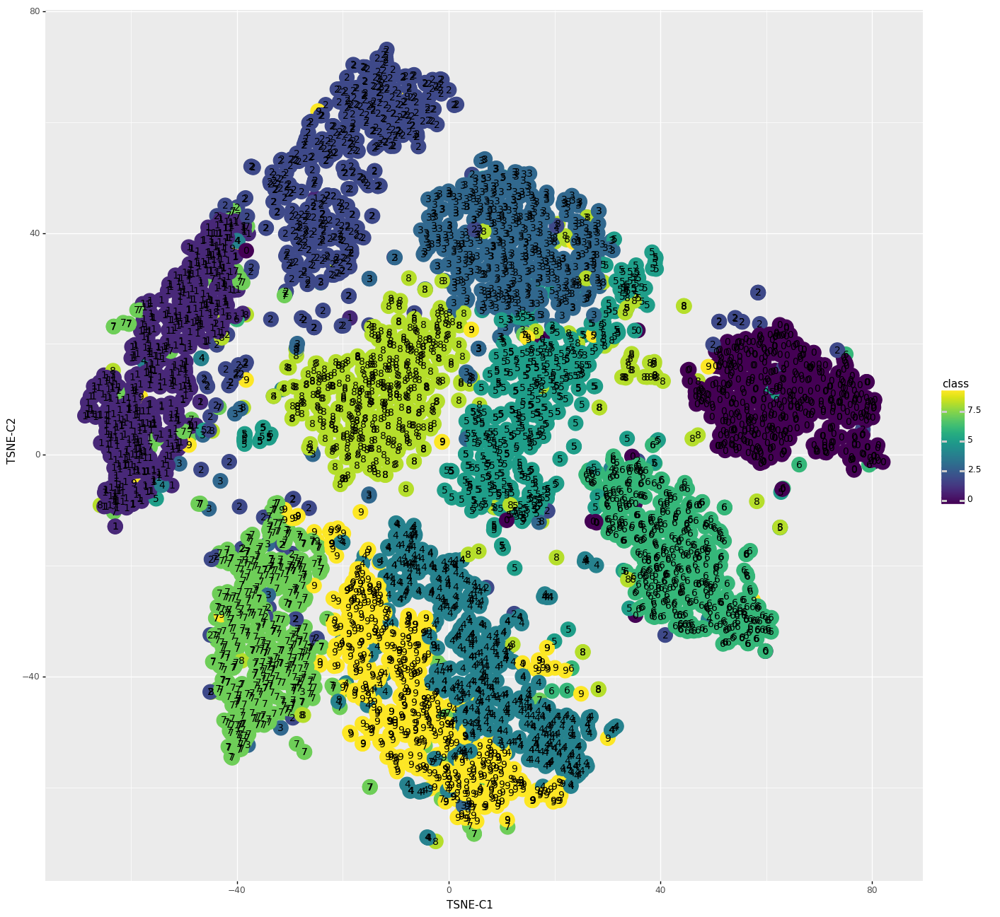

<ggplot: (8767801561432)>

In [9]:
df = tsne.feature_map_batch(X, r_labels_set, perplexity=30)
tsne.plot_gg(df)

/Users/suneeta.mall/opt/miniconda3/envs/feature_analysis/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.


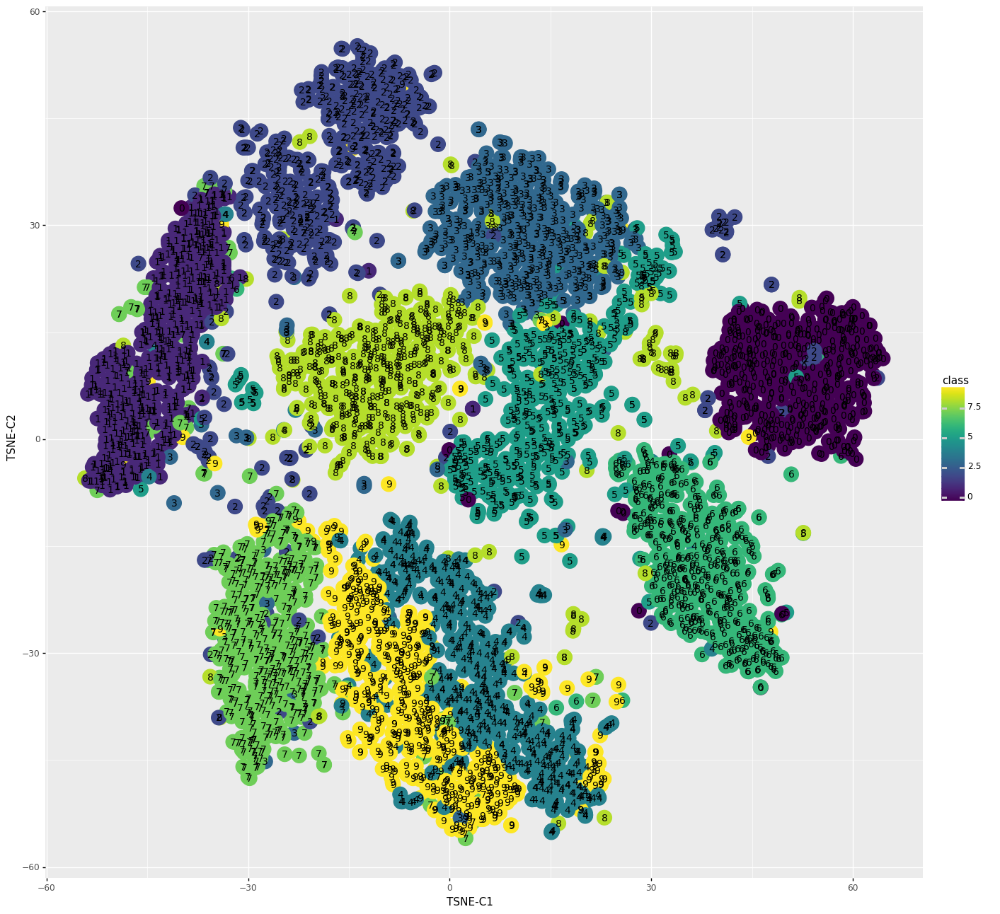

<ggplot: (8767783529918)>

In [10]:
df = tsne.feature_map_batch(X, r_labels_set, perplexity=50)
tsne.plot_gg(df)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


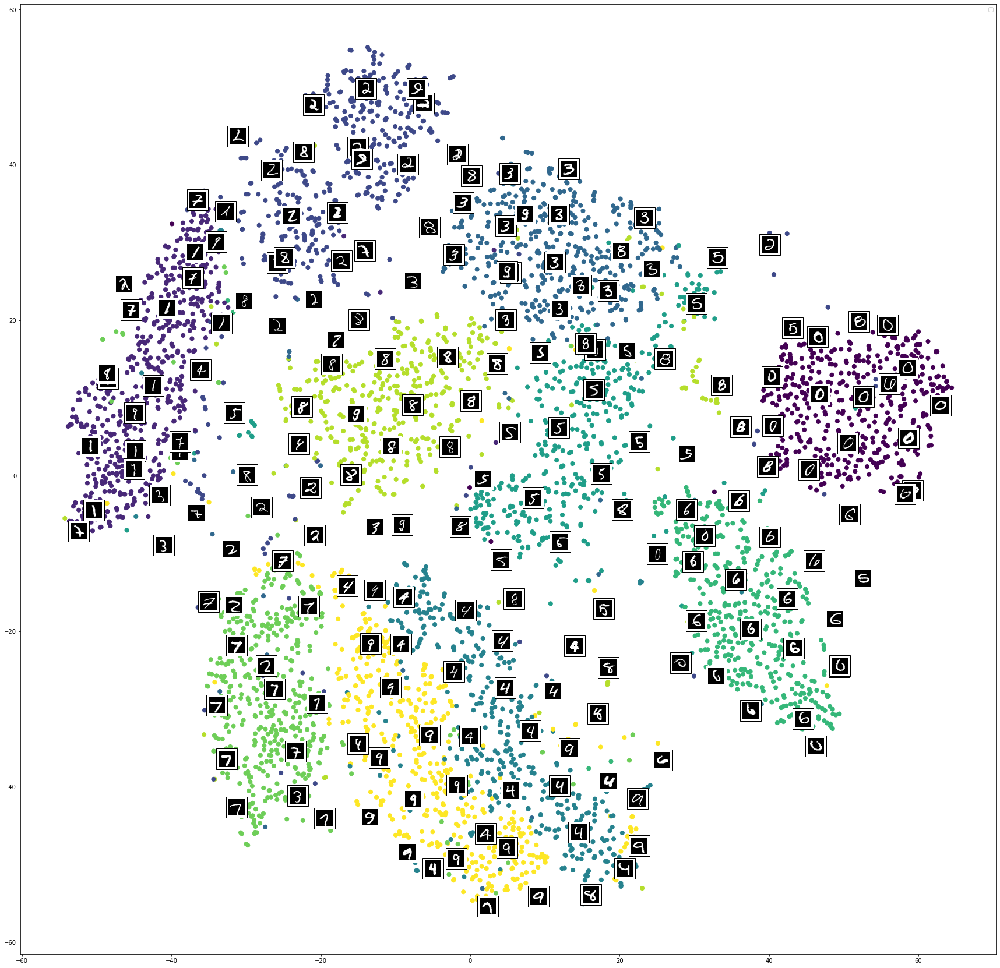

In [11]:
tsne.plot_with_images(df, labels=r_labels_set, images=image_data_set)

In [12]:
## UMAP

In [13]:
%matplotlib inline

umappr = UMapExplorer()
mapper, r_labels_set = umappr.feature_map(X, r_labels_set)

In [14]:
umappr.plot_interactive(mapper, r_labels_set, image_data_set)

Loading BokehJS ...

In [15]:
## Umap Parametrics

In [16]:
embedding = umappr.feature_map_parametric(r_features_set, r_labels_set, new_shape, total_item)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 1, 14, 32)         8096      
                                                                 
 conv2d_1 (Conv2D)           (None, 1, 7, 64)          18496     
                                                                 
 flatten (Flatten)           (None, 448)               0         
                                                                 
 dense (Dense)               (None, 256)               114944    
                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dense_2 (Dense)             (None, 2)                 514       
                                                                 
Total params: 207,842
Trainable params: 207,842
Non-trai

2022-05-23 17:14:56.836920: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
/Users/suneeta.mall/opt/miniconda3/envs/feature_analysis/lib/python3.8/site-packages/umap/parametric_umap.py:148: UserWarning: tensorflow_probability not installed or incompatible to current                 tensorflow installation. Setting global_correlation_loss_weight to zero.


Epoch 1/10
1570/1570 [==============================] - 97s 60ms/step - loss: 0.2207
Epoch 2/10
1570/1570 [==============================] - 96s 61ms/step - loss: 0.1633
Epoch 3/10
1570/1570 [==============================] - 100s 64ms/step - loss: 0.1531
Epoch 4/10
1570/1570 [==============================] - 126s 80ms/step - loss: 0.1492
Epoch 5/10
1570/1570 [==============================] - 120s 76ms/step - loss: 0.1467
Epoch 6/10
1570/1570 [==============================] - 109s 69ms/step - loss: 0.1450
Epoch 7/10
1570/1570 [==============================] - 118s 75ms/step - loss: 0.1437
Epoch 8/10
1570/1570 [==============================] - 112s 71ms/step - loss: 0.1432
Epoch 9/10
1570/1570 [==============================] - 123s 78ms/step - loss: 0.1424
Epoch 10/10
1570/1570 [==============================] - 103s 66ms/step - loss: 0.1425


In [17]:
%matplotlib inline

mapper, r_labels_set = umappr.feature_map(embedding, r_labels_set)
# umappr.plot_gg(mapper, r_labels_set)

In [18]:
umappr.plot_interactive(mapper, r_labels_set, image_data_set)

Loading BokehJS ...

In [19]:
# Try with TSNE

/Users/suneeta.mall/opt/miniconda3/envs/feature_analysis/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.


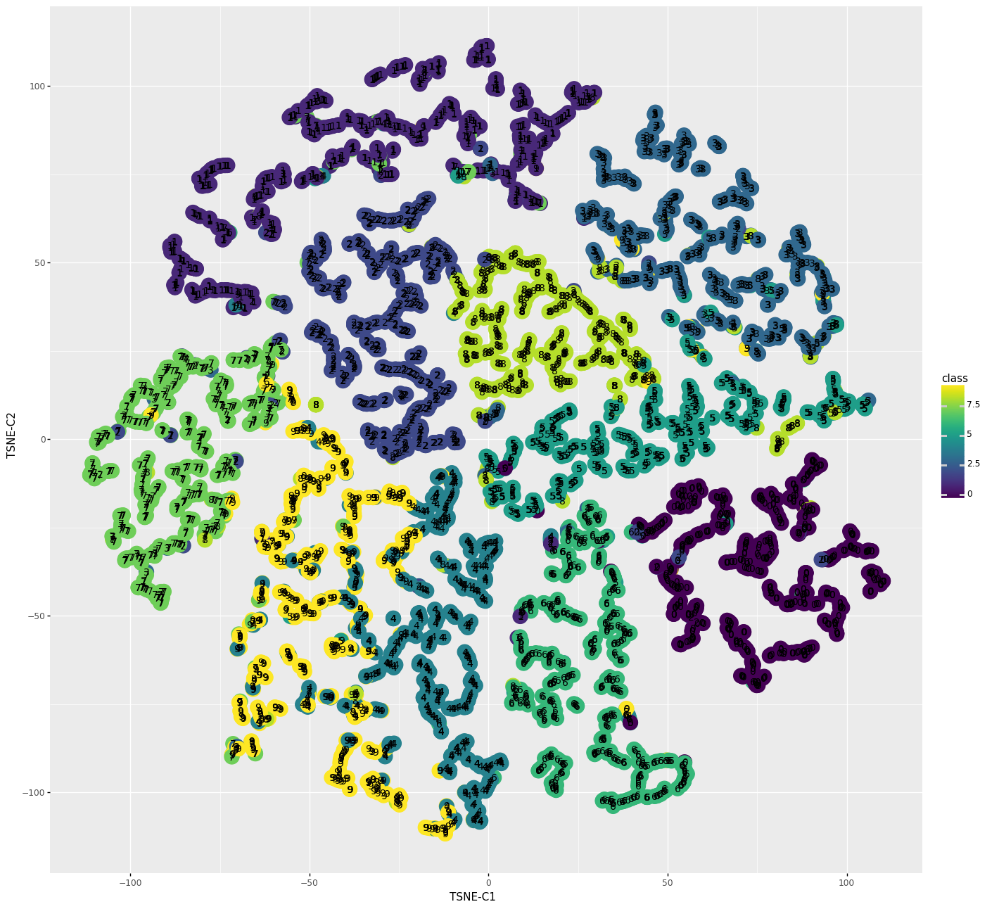

<ggplot: (8767802484640)>

In [20]:
%matplotlib inline

df = tsne.feature_map_batch(embedding, r_labels_set)
tsne.plot_gg(df)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


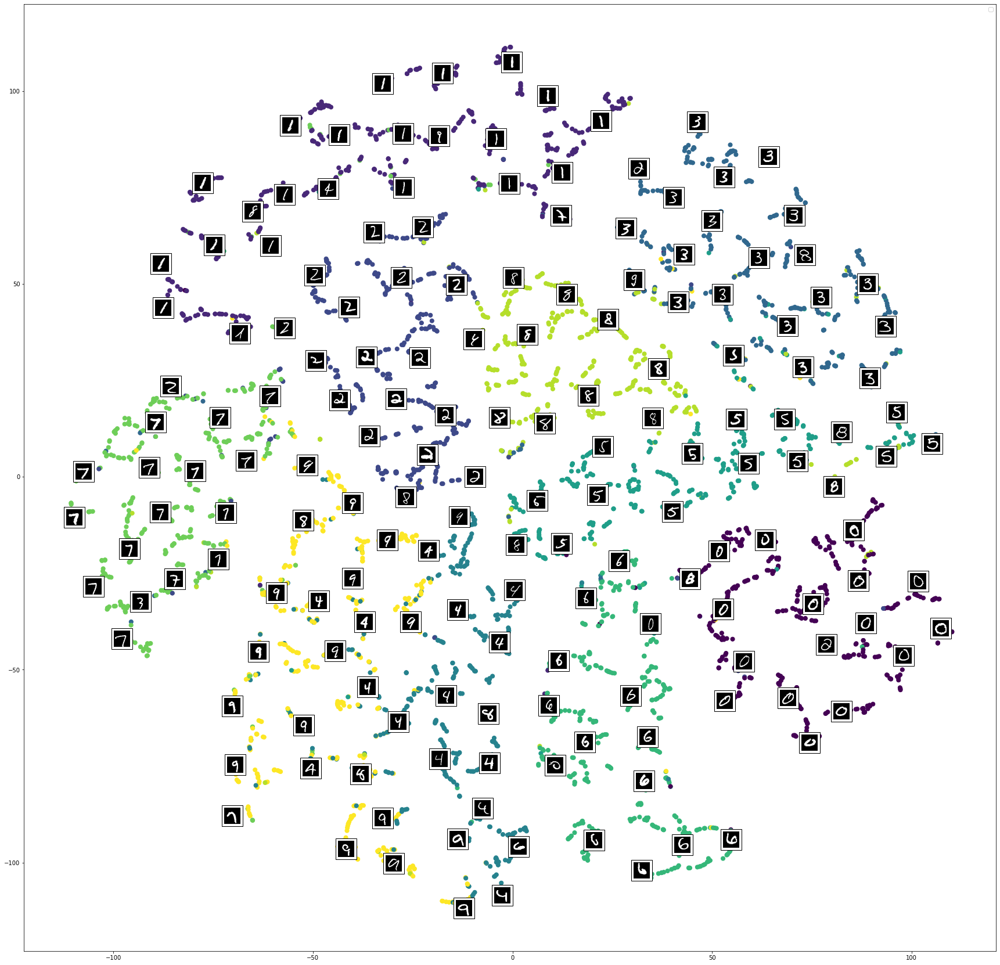

In [21]:
tsne.plot_with_images(df, labels=r_labels_set, images=image_data_set)